# Predicting Next_Tmax (Regression Problem)

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import OrdinalEncoder
import pickle

import warnings
warnings.filterwarnings('ignore')

In [4]:
df_tmax =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Temperature%20Forecast/temperature.csv')
df_tmax =df_tmax.sample(frac =1)
df_tmax.head(15)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
5207,8.0,22-07-2016,33.5,26.0,60.464970,80.179939,29.726448,25.492519,7.316978,52.540991,...,0.164768,1.034464,0.000000,37.4697,126.910,52.5180,1.5629,5586.337402,31.8,27.3
5219,20.0,22-07-2016,32.4,24.4,69.198097,90.297951,28.201469,23.341872,10.180849,91.207587,...,0.390606,0.639410,0.000000,37.6181,127.004,146.5540,4.7296,5667.545410,30.9,25.3
3628,4.0,21-07-2015,28.9,22.9,61.291393,98.702072,30.571856,23.984468,5.301850,100.416871,...,1.281850,0.020803,0.000000,37.6450,127.022,45.7160,2.5348,5620.059082,32.5,25.0
7398,24.0,16-08-2017,27.2,21.4,59.818542,82.137527,29.402308,22.997073,7.945757,40.729326,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.2223,4950.971680,29.0,22.2
836,12.0,02-08-2013,27.7,23.6,63.980316,86.939392,28.795075,26.594121,8.777759,17.892180,...,0.000000,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5428.586426,33.3,24.8
5819,20.0,15-08-2016,32.7,24.6,57.916988,95.894875,30.312679,24.316711,7.743532,78.019322,...,0.127327,0.131771,0.000000,37.6181,127.004,146.5540,4.7296,5058.948242,34.4,25.4
7448,24.0,18-08-2017,29.8,24.0,46.978271,81.383942,31.110752,23.903767,6.768132,54.278631,...,0.000000,0.001727,1.108039,37.5237,126.909,17.2956,0.2223,4883.712891,29.4,24.0
1581,7.0,01-07-2014,30.3,21.9,61.029110,87.371193,28.117208,23.355743,6.455472,98.209840,...,0.000000,0.000000,0.014037,37.5776,126.838,12.3700,0.0985,5843.853516,29.8,21.7
5760,11.0,13-08-2016,34.5,27.0,69.181450,88.167763,30.173130,27.425298,4.849299,55.161901,...,0.001063,5.769093,0.000000,37.5372,127.085,28.7000,0.6233,5039.804199,30.7,26.5
2750,1.0,17-08-2014,23.6,20.6,76.264267,93.544319,22.730016,19.320953,8.664450,76.998465,...,0.618039,0.240937,4.265625,37.6046,126.991,212.3350,2.7850,5087.199707,20.9,17.8


In [5]:
print("No. of Duplicate Records are :", df_tmax.duplicated().sum())

No. of Duplicate Records are : 0


In [6]:
df_tmax.shape

(7752, 25)

In [7]:
# Checking stastical health of data
df_tmax.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [8]:
df_tmax.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [9]:
# Deleting null values
df_tmax =df_tmax.dropna()

In [10]:
df_tmax.shape

(7588, 25)

In [11]:
df_tmax.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

__All null values are deleted.__

In [12]:
# Checking count of each column
for i in df_tmax:
    print(df_tmax[i].value_counts())

station
10.0    307
25.0    307
17.0    307
23.0    307
2.0     307
18.0    307
4.0     306
3.0     306
13.0    305
16.0    304
21.0    304
20.0    304
14.0    303
1.0     303
19.0    302
9.0     302
22.0    302
15.0    302
12.0    302
24.0    302
6.0     301
11.0    301
7.0     301
8.0     300
5.0     296
Name: count, dtype: int64
Date
26-08-2013    25
29-08-2013    25
27-07-2017    25
30-06-2013    25
02-07-2014    25
              ..
13-08-2015    22
23-08-2017    22
24-07-2015    22
06-07-2017    22
30-06-2017    16
Name: count, Length: 307, dtype: int64
Present_Tmax
31.4    112
29.4    108
29.1    106
30.6    105
29.2    105
       ... 
21.2      1
20.4      1
36.3      1
20.3      1
20.0      1
Name: count, Length: 167, dtype: int64
Present_Tmin
24.0    160
23.8    153
23.5    143
23.1    143
23.7    140
       ... 
13.6      1
14.3      1
11.3      1
29.9      1
29.1      1
Name: count, Length: 155, dtype: int64
LDAPS_RHmin
71.658089    2
77.030350    2
51.810596    2
60.464970 

In [13]:
df_tmax.reset_index(inplace =True, drop =True)

In [14]:
# Checking datatype of dataset
df_tmax.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [15]:
# Changing data of date
df_tmax['Date'] =pd.to_datetime(df_tmax['Date'], format ='%d-%m-%Y')
df_tmax.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7588 entries, 0 to 7587
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7588 non-null   float64       
 1   Date              7588 non-null   datetime64[ns]
 2   Present_Tmax      7588 non-null   float64       
 3   Present_Tmin      7588 non-null   float64       
 4   LDAPS_RHmin       7588 non-null   float64       
 5   LDAPS_RHmax       7588 non-null   float64       
 6   LDAPS_Tmax_lapse  7588 non-null   float64       
 7   LDAPS_Tmin_lapse  7588 non-null   float64       
 8   LDAPS_WS          7588 non-null   float64       
 9   LDAPS_LH          7588 non-null   float64       
 10  LDAPS_CC1         7588 non-null   float64       
 11  LDAPS_CC2         7588 non-null   float64       
 12  LDAPS_CC3         7588 non-null   float64       
 13  LDAPS_CC4         7588 non-null   float64       
 14  LDAPS_PPT1        7588 n

## Data Visualizatin 

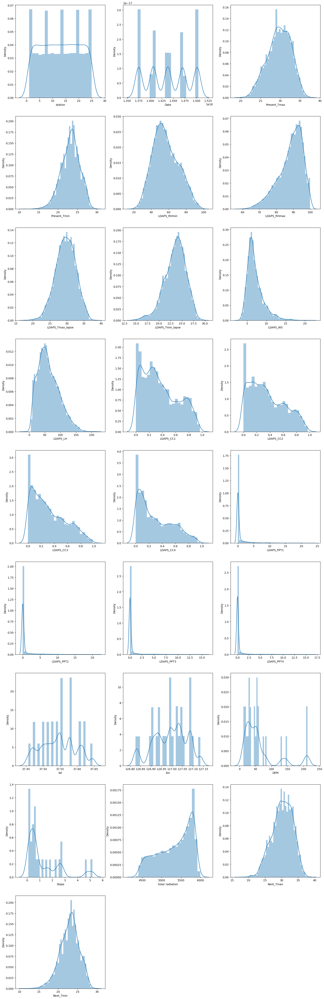

In [16]:
# Ploting Distribution plot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmax:
    #if df_tmax[i].dtypes =='datetime64[ns]':
        #continue
    if plotnumber <= 25:
        plt.subplot(9, 3, plotnumber)
        sns.distplot(df_tmax[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show()

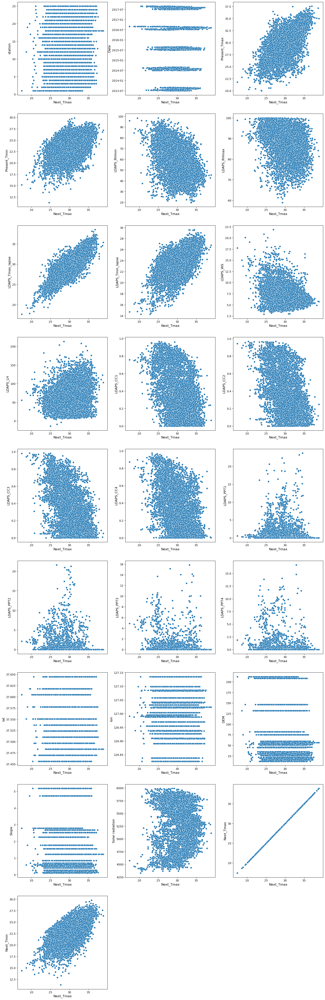

In [17]:
# Ploting Scatterplot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmax:
   
    if plotnumber <= 25:
        plt.subplot(9, 3, plotnumber)
        sns.scatterplot(x ='Next_Tmax', y =i, data =df_tmax)
        plt.xlabel('Next_Tmax', fontsize =12)
        plt.ylabel(i, fontsize =12)
    plotnumber+=1
plt.show()

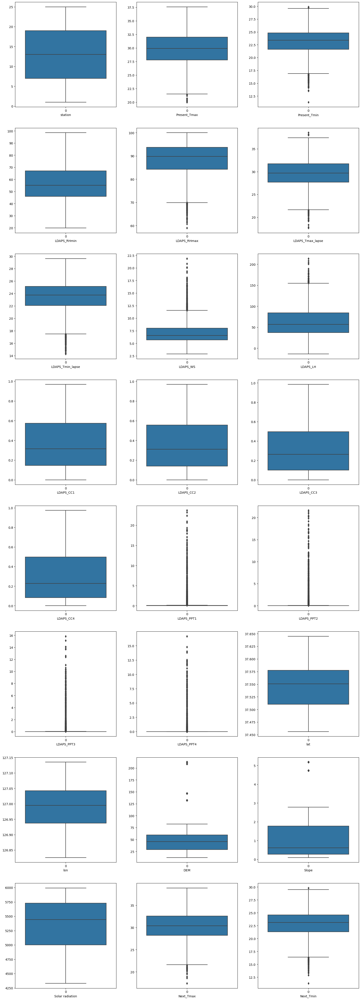

In [18]:
# Finding outliers using boxplot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmax:
    if df_tmax[i].dtype =='datetime64[ns]':
        continue
    if plotnumber <=25:
        plt.subplot(9, 3, plotnumber)
        sns.boxplot(df_tmax[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show()

In [19]:
# Removing outliers using zscore
df_score =df_tmax[['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
                  'LDAPS_LH', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Next_Tmin' ]]
z =np.abs(zscore(df_score))
z

,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Next_Tmin
0,1.264366,1.168062,1.136395,0.036123,0.845591,0.102385,0.295441,0.305589,0.181257,0.662696,0.224971,0.173051,1.768339
1,0.893647,0.501595,0.269084,0.481996,0.072538,1.417964,0.852483,0.304135,0.051705,0.317975,0.224971,1.558099,0.962567
2,0.285914,0.123217,1.436488,0.323354,0.201792,0.823306,1.125886,0.305564,0.459561,0.221816,0.224971,0.298272,0.841701
3,0.858844,0.748029,0.864469,0.074005,0.219735,0.391228,0.646103,0.278956,0.275777,0.239969,0.224971,0.821476,0.286379
4,0.690335,0.168362,0.197449,0.280315,1.315874,0.773426,1.324086,0.296265,0.275777,0.239969,0.224971,1.292340,0.761124
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,1.330668,0.789683,0.939851,0.077248,0.810337,0.119057,0.588894,0.305589,0.275777,0.239969,0.224971,2.769091,1.132440
7584,0.622932,0.706375,2.012730,0.055610,1.170410,0.637435,0.284189,0.305589,0.275777,0.239969,0.224971,0.611527,1.092151
7585,0.319616,0.914645,0.157539,0.040147,0.396764,1.241448,0.734621,0.305589,0.275777,0.239969,0.224971,0.912154,0.761124
7586,0.185910,0.001746,1.264838,0.103905,0.226307,0.531582,1.014324,0.305589,0.275777,0.137753,0.224971,0.038397,0.044648


In [20]:
df_tmax =df_tmax[(z < 4).all(axis =1)]

In [21]:
df_tmax.shape

(7109, 25)

__We have used z < 4 because data loss was more than 10% when used z <3.__

In [22]:
# Excluding date column to check skewness in the dataset
df_num =df_tmax.drop(columns =['Date'])

In [23]:
df_num.skew()

station            -0.002196
Present_Tmax       -0.300800
Present_Tmin       -0.348750
LDAPS_RHmin         0.318940
LDAPS_RHmax        -0.797229
LDAPS_Tmax_lapse   -0.198535
LDAPS_Tmin_lapse   -0.559884
LDAPS_WS            1.253663
LDAPS_LH            0.623333
LDAPS_CC1           0.544109
LDAPS_CC2           0.492697
LDAPS_CC3           0.692419
LDAPS_CC4           0.700244
LDAPS_PPT1          3.892295
LDAPS_PPT2          4.648932
LDAPS_PPT3          5.628645
LDAPS_PPT4          6.087176
lat                 0.090554
lon                -0.279617
DEM                 1.732099
Slope               1.573312
Solar radiation    -0.526582
Next_Tmax          -0.323789
Next_Tmin          -0.389815
dtype: float64

In [24]:
# Removing skewness from the dataset
df_tmax['LDAPS_WS'] =np.cbrt(df_tmax['LDAPS_WS'])
df_tmax['LDAPS_LH'] =np.cbrt(df_tmax['LDAPS_LH'])
df_tmax['LDAPS_CC3'] =np.cbrt(df_tmax['LDAPS_CC3'])
df_tmax['LDAPS_CC4'] =np.cbrt(df_tmax['LDAPS_CC4'])
df_tmax['LDAPS_PPT1'] =np.cbrt(df_tmax['LDAPS_PPT1'])
df_tmax['LDAPS_PPT2'] =np.cbrt(df_tmax['LDAPS_PPT2'])
df_tmax['LDAPS_PPT3'] =np.cbrt(df_tmax['LDAPS_PPT3'])
df_tmax['LDAPS_PPT4'] =np.cbrt(df_tmax['LDAPS_PPT4'])
df_tmax['DEM'] =np.cbrt(df_tmax['DEM'])
df_tmax['Slope'] =np.cbrt(df_tmax['Slope'])

In [25]:
# Again Checking Skewness
df_num =df_tmax.drop(columns =['Date'])
df_num.skew()

station            -0.002196
Present_Tmax       -0.300800
Present_Tmin       -0.348750
LDAPS_RHmin         0.318940
LDAPS_RHmax        -0.797229
LDAPS_Tmax_lapse   -0.198535
LDAPS_Tmin_lapse   -0.559884
LDAPS_WS            0.727546
LDAPS_LH           -0.246960
LDAPS_CC1           0.544109
LDAPS_CC2           0.492697
LDAPS_CC3          -0.546880
LDAPS_CC4          -0.428713
LDAPS_PPT1          1.869176
LDAPS_PPT2          2.304703
LDAPS_PPT3          2.462340
LDAPS_PPT4          2.778654
lat                 0.090554
lon                -0.279617
DEM                 0.923733
Slope               0.616290
Solar radiation    -0.526582
Next_Tmax          -0.323789
Next_Tmin          -0.389815
dtype: float64

In [26]:
# Again Removing skewness from the dataset

df_tmax['LDAPS_PPT1'] =np.cbrt(df_tmax['LDAPS_PPT1'])
df_tmax['LDAPS_PPT2'] =np.cbrt(df_tmax['LDAPS_PPT2'])
df_tmax['LDAPS_PPT3'] =np.cbrt(df_tmax['LDAPS_PPT3'])
df_tmax['LDAPS_PPT4'] =np.cbrt(df_tmax['LDAPS_PPT4'])
df_tmax['DEM'] =np.cbrt(df_tmax['DEM'])
df_tmax['Slope'] =np.cbrt(df_tmax['Slope'])

In [27]:
# Again Checking Skewness
df_num =df_tmax.drop(columns =['Date'])
df_num.skew()

station            -0.002196
Present_Tmax       -0.300800
Present_Tmin       -0.348750
LDAPS_RHmin         0.318940
LDAPS_RHmax        -0.797229
LDAPS_Tmax_lapse   -0.198535
LDAPS_Tmin_lapse   -0.559884
LDAPS_WS            0.727546
LDAPS_LH           -0.246960
LDAPS_CC1           0.544109
LDAPS_CC2           0.492697
LDAPS_CC3          -0.546880
LDAPS_CC4          -0.428713
LDAPS_PPT1          0.928815
LDAPS_PPT2          1.165468
LDAPS_PPT3          1.246509
LDAPS_PPT4          1.608850
lat                 0.090554
lon                -0.279617
DEM                 0.587223
Slope               0.252440
Solar radiation    -0.526582
Next_Tmax          -0.323789
Next_Tmin          -0.389815
dtype: float64

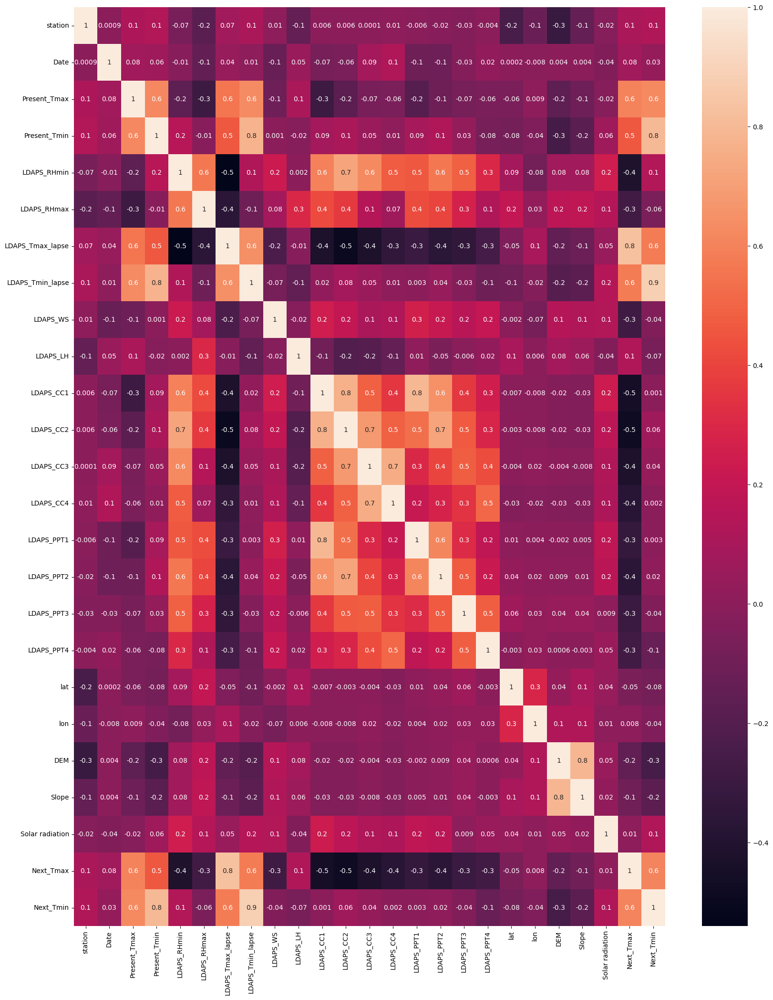

In [28]:
# Plotting heatmap
plt.figure(figsize =(20,25))
sns.heatmap(df_tmax.corr(), annot =True, fmt ='.1g')
plt.show()

__We found multicollinearity between (Next_Tmin and LDAPS_Tmin_lapse), (Present_Tmin and Next_Tmin), (Present_Tmin and LDAPS_Tmin_lapse), (LDAPS_CC1 and LDAPS_CC2), (DEM and slope)

In [29]:
df_tmax.info()

<class 'pandas.core.frame.DataFrame'>
Index: 7109 entries, 0 to 7587
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7109 non-null   float64       
 1   Date              7109 non-null   datetime64[ns]
 2   Present_Tmax      7109 non-null   float64       
 3   Present_Tmin      7109 non-null   float64       
 4   LDAPS_RHmin       7109 non-null   float64       
 5   LDAPS_RHmax       7109 non-null   float64       
 6   LDAPS_Tmax_lapse  7109 non-null   float64       
 7   LDAPS_Tmin_lapse  7109 non-null   float64       
 8   LDAPS_WS          7109 non-null   float64       
 9   LDAPS_LH          7109 non-null   float64       
 10  LDAPS_CC1         7109 non-null   float64       
 11  LDAPS_CC2         7109 non-null   float64       
 12  LDAPS_CC3         7109 non-null   float64       
 13  LDAPS_CC4         7109 non-null   float64       
 14  LDAPS_PPT1        7109 non-nu

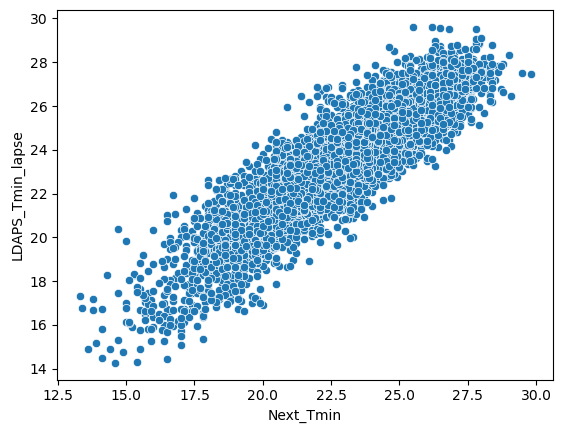

In [30]:
# Checking multicollinearity using scatterplot
sns.scatterplot(x ='Next_Tmin', y ='LDAPS_Tmin_lapse', data =df_tmax)
plt.show()

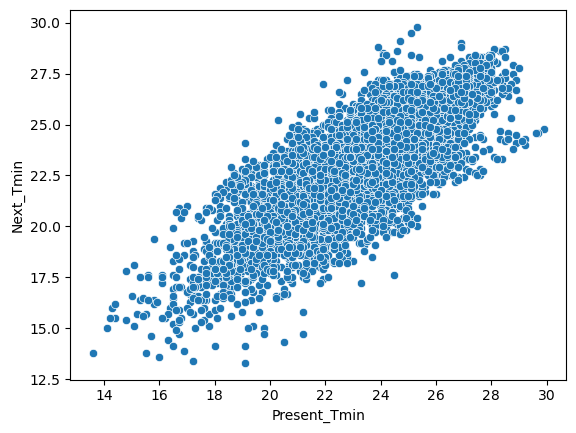

In [31]:
sns.scatterplot(x ='Present_Tmin', y ='Next_Tmin', data =df_tmax)
plt.show()

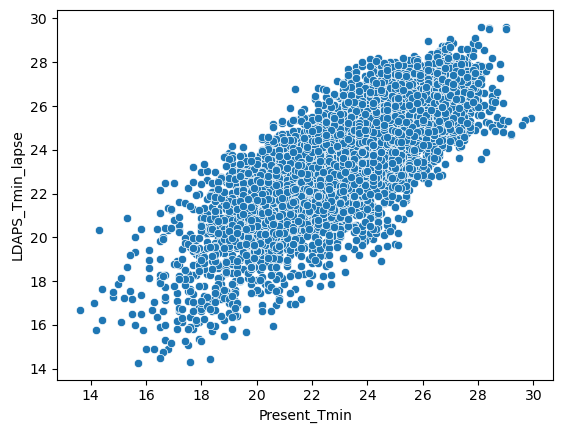

In [32]:
sns.scatterplot(x ='Present_Tmin', y ='LDAPS_Tmin_lapse', data =df_tmax)
plt.show()

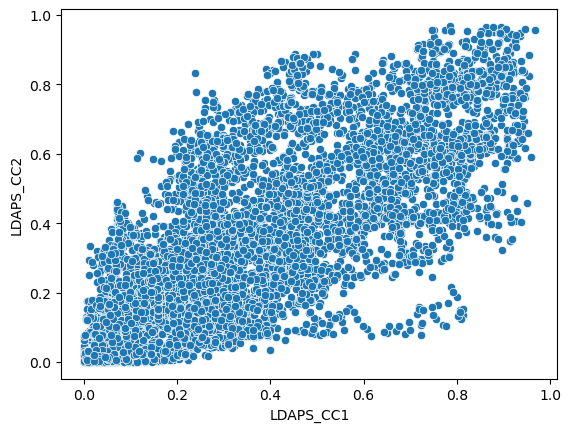

In [33]:
sns.scatterplot(x ='LDAPS_CC1', y ='LDAPS_CC2', data =df_tmax)
plt.show()

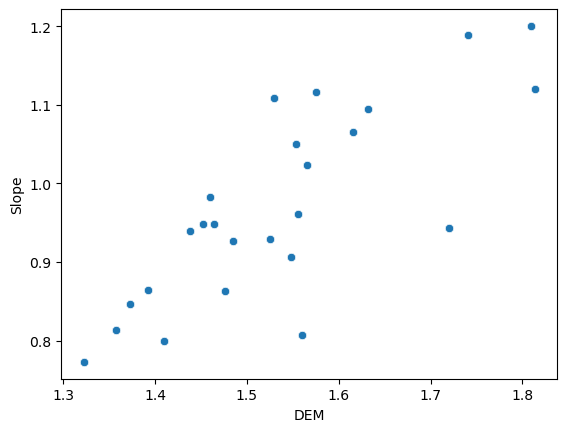

In [34]:
sns.scatterplot(x ='DEM', y ='Slope', data =df_tmax)
plt.show()

In [35]:
# Deleting Next_Tmin, LDAPS_Tmin_lapse, LDAPS_CC1
df_tmax .drop(columns =['Next_Tmin', 'LDAPS_Tmin_lapse', 'LDAPS_CC1'], inplace =True)

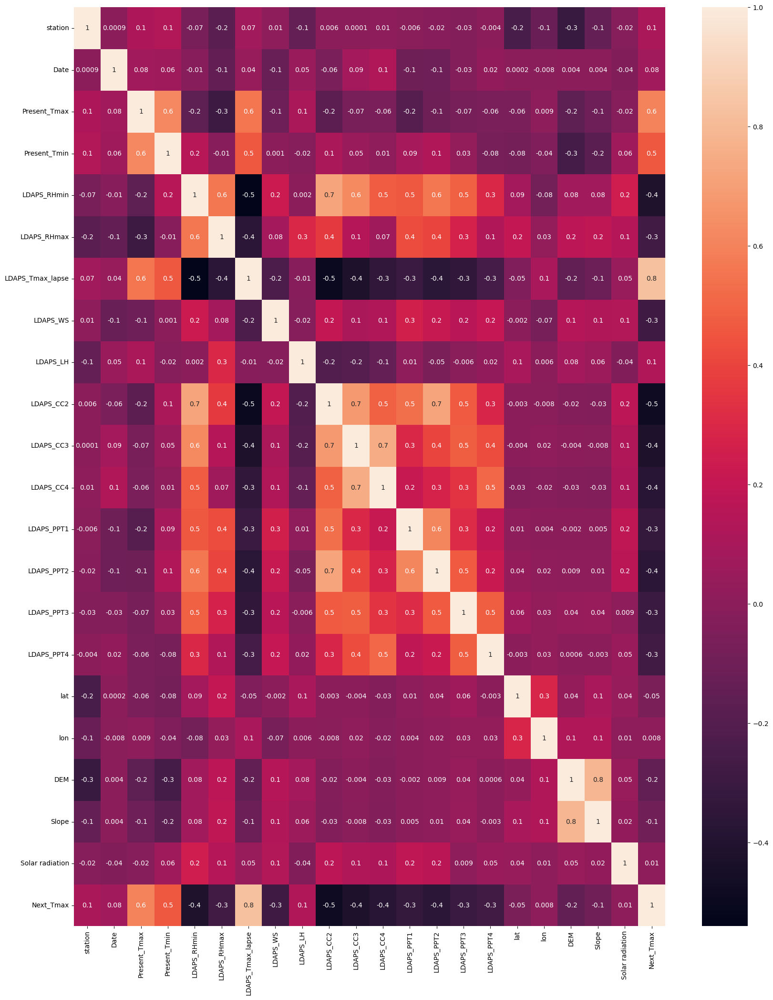

In [36]:
# Again Plotting heatmap
plt.figure(figsize =(20,25))
sns.heatmap(df_tmax.corr(), annot =True, fmt ='.1g')
plt.show()

In [37]:
#Deleting data column as it will not have any impact on label prediction
df_tmax.drop(columns =['Date'], inplace =True)

In [38]:
# Seperating Features and label
x =df_tmax.drop(columns =['Next_Tmax'])
y =df_tmax[['Next_Tmax']]

In [39]:
# Data Standardization
scaler =StandardScaler()
x =pd.DataFrame(scaler.fit_transform(x), columns =x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,-0.696457,1.243097,1.165398,0.326597,-1.085992,-0.012700,0.279439,-0.102335,1.391692,1.049030,1.062947,-0.694514,1.443772,2.177287,-0.513087,-1.489729,-1.017798,0.142452,0.683214,0.576089
1,0.967223,0.869271,0.497433,0.941558,0.314207,-0.547274,1.599941,0.892663,1.672903,0.997061,1.046181,0.531024,1.652031,2.032728,-0.513087,1.466660,0.165535,1.584308,1.822617,0.766130
2,-1.251017,-0.320175,-0.128785,0.384791,1.477227,0.283653,-0.875679,1.085714,-0.503623,0.225625,0.134078,0.086150,1.973477,1.199339,-0.513087,2.002556,0.392130,-0.040121,1.163614,0.655003
3,1.521783,-0.897906,-0.755002,0.281078,-0.815087,-0.126326,0.595529,-0.503518,-0.361340,-0.104292,0.332822,0.998407,-0.625243,-0.599971,-0.513087,-0.413954,-1.030386,-1.243517,-1.012341,-0.910775
4,-0.141897,-0.727985,0.163450,0.574137,-0.150573,-0.339188,0.989112,-1.589553,-0.021101,0.663066,0.129175,0.812072,-0.625243,-0.599971,-0.513087,0.123934,-0.035884,1.431033,-0.205065,0.206925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7104,-1.666937,-1.373684,-0.796750,-0.842048,0.982455,0.029731,0.024612,0.693812,-1.279551,-1.247016,-1.934717,-0.694514,-0.625243,-0.599971,-0.513087,1.197717,0.001882,2.147015,1.260169,-1.077886
7105,-0.280537,-0.660017,-0.713254,-0.690513,-1.959036,-0.107347,-0.622783,-0.090509,-1.096977,-0.418154,-0.186105,-0.694514,-0.625243,-0.599971,-0.513087,-0.145010,1.185215,-0.632729,-0.161822,-1.770388
7106,-0.835097,-0.354159,-0.921993,0.460262,-0.110813,-0.008549,-1.495811,0.805421,0.461458,-0.231694,0.586560,-0.694514,-0.625243,-0.599971,-0.513087,0.659829,-1.924180,-1.629257,-1.618283,0.715670
7107,-0.003257,0.155603,-0.003541,-0.379861,-1.213952,-0.157175,-0.484071,-1.019842,-0.415285,0.507527,-1.897583,-0.694514,-0.625243,1.580268,-0.513087,0.659829,1.160037,0.316664,1.223115,-1.842050


In [40]:
# Checking variance inflation factor
vif =pd.DataFrame()
vif['Scores'] =[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] =x.columns
vif

,Scores,Features
0,1.255479,station
1,2.329610,Present_Tmax
2,2.733379,Present_Tmin
3,4.249123,LDAPS_RHmin
4,2.264607,LDAPS_RHmax
5,3.252787,LDAPS_Tmax_lapse
6,1.232417,LDAPS_WS
7,1.395244,LDAPS_LH
8,4.233235,LDAPS_CC2
9,3.804659,LDAPS_CC3


__VIF scores of all the columns are within range. We will not delete any column based on vif score.__

# EDA Completed

## Model Building

### Finding Best random state

In [41]:
maxrs =0
maxacc =0

for i in range(1, 200):
    x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =i)
    LR =LinearRegression()
    LR.fit(x_train, y_train)
    pred =LR.predict(x_test)
    acc =r2_score(y_test, pred)
    
    if acc > maxacc:
        maxacc =acc
        maxrs =1
        
print("Maximum accuracy is :", maxacc, "at random state :", maxrs)

Maximum accuracy is : 0.7878883226161362 at random state : 1


In [42]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =maxrs)

In [43]:
RFR =RandomForestRegressor()
ETR =ExtraTreesRegressor()
LR =LinearRegression()
svr =SVR()
GBR =GradientBoostingRegressor()
ADR =AdaBoostRegressor()
BR =BaggingRegressor()
DTR =DecisionTreeRegressor()
lasso =Lasso()
ridge =Ridge()
knn =KNeighborsRegressor()

In [44]:
# Defining Models
models ={'RandomForestRegressor' :RFR,
        'ExtraTreesRegressor' :ETR,
        'LinearRegression' :LR,
        'SVR': svr,
        'GradientBoostingRegressor': GBR,
        'AdaBoostRegressor' :ADR,
        'BaggingRegressor' :BR,
        'DecisionTreeRegressor' :DTR,
        'Lasso' :lasso,
        'Ridge': ridge,
        'KNeighborsRegressor' :knn}

for name, model in models.items():
    model.fit(x_train, y_train)
    pred_test =model.predict(x_test)
    pred_train =model.predict(x_train)
    acc =r2_score(y_test, pred_test)
    
    print("Model Name :", name)
    print('*'*20)
    print("Accuracy of model on training data :", (r2_score(y_train, pred_train))*100)
    print("Accuracy of model on test data :", (r2_score(y_test, pred_test))*100)
    print("Mean Squared Error :", mean_squared_error(y_test, pred))
    print("Mean Absolute Error :", mean_absolute_error(y_test, pred))
    print("Root Mean Squared Error :", np.sqrt(mean_squared_error(y_test, pred)))
    
    print('\n')
    print("Cross Validation")
    print("*"*20)
    score =cross_val_score(model, x, y, cv=5)
    print(score)
    print(score.mean())
    print("Difference between R2 Score and cross validation is :",(acc - (score.mean()))*100)
    print('='*80)
    print('\n')

Model Name : RandomForestRegressor
********************
Accuracy of model on training data : 98.35393024122341
Accuracy of model on test data : 88.5971094958492
Mean Squared Error : 16.41115228893379
Mean Absolute Error : 3.2631452424546836
Root Mean Squared Error : 4.051068042989872


Cross Validation
********************
[0.88369471 0.88648089 0.89518504 0.89388359 0.89391203]
0.8906312508692185
Difference between R2 Score and cross validation is : -0.4660155910726549


Model Name : ExtraTreesRegressor
********************
Accuracy of model on training data : 100.0
Accuracy of model on test data : 90.6692670417554
Mean Squared Error : 16.41115228893379
Mean Absolute Error : 3.2631452424546836
Root Mean Squared Error : 4.051068042989872


Cross Validation
********************
[0.90683099 0.91058813 0.9131405  0.9117958  0.91886563]
0.9122442093852504
Difference between R2 Score and cross validation is : -0.5551538967696446


Model Name : LinearRegression
********************
Accuracy 

__ExtraTreesRegressor is our best model with the accuracy of 90.57%.__

## Hyperparameter Tunning

In [45]:
parameter ={'n_estimators' :[10, 20, 50],
           'criterion': ['squared_error', 'friedman_mse'],
           'max_depth': [2, 8, 16],
           'min_samples_split' :[2, 4, 6],
           'min_samples_leaf' :[1, 2],
           'max_features' :['sqrt', 'log2']
           }

In [46]:
GCV =GridSearchCV(ExtraTreesRegressor(), parameter, cv=5)
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse'],
                         'max_depth': [2, 8, 16],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [10, 20, 50]})

In [47]:
GCV.best_params_

{'criterion': 'friedman_mse',
 'max_depth': 16,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 50}

In [64]:
ETR =ExtraTreesRegressor(criterion ='poisson',
                        max_depth =36,
                        max_features ='log2',
                        min_samples_leaf =1,
                        n_estimators =100)
ETR.fit(x_train, y_train)
pred =ETR.predict(x_test)
acc =r2_score(y_test, pred)
print("Accuracy is :", acc*100)

Accuracy is : 89.67461954653056


__Accuracy does not increase efter hyperparameter tunning. We will go with the default parameters.__

In [65]:
ETR =ExtraTreesRegressor()
ETR.fit(x_train, y_train)
pred =ETR.predict(x_test)
acc =r2_score(y_test, pred)
print("Accuracy is :", acc*100)

Accuracy is : 90.83280936703906


In [66]:
# Saving Model
pickle.dump(ETR, open('Temp_Forecast_Max.pkl', 'wb'))

In [70]:
#Loading Model
loaded_model =pickle.load(open('Temp_Forecast_Max.pkl', 'rb'))
pred =loaded_model.predict(x_test)
acc =loaded_model.score(x_test, y_test)
print(acc*100)

90.83280936703906


In [72]:
# Comparing Actual Vs Predicted
actual =np.array(y_test)
df1 =pd.DataFrame()
df1['Predicted'] =pred
df1['Actual']=actual
df1

,Predicted,Actual
0,29.474,31.1
1,29.354,29.9
2,31.334,31.2
3,29.018,28.8
4,27.856,28.0
...,...,...
2128,32.693,32.4
2129,36.198,36.8
2130,31.653,32.6
2131,34.116,34.0


# Predicting Next_Tmin (Regression Problem)

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from statsmodels.stats.outliers_influence import variance_inflation_factor
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import Lasso, Ridge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import OrdinalEncoder
import pickle

import warnings
warnings.filterwarnings('ignore')

In [2]:
df_tmin =pd.read_csv(r'https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Temperature%20Forecast/temperature.csv')
df_tmin =df_tmin.sample(frac =1)
df_tmin.head(15)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7377,3.0,16-08-2017,25.5,20.8,62.036983,86.258919,28.623802,22.244462,6.025580,22.913853,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.2661,4969.604004,28.1,20.9
741,17.0,29-07-2013,30.9,25.1,56.883301,93.397415,30.868714,24.129805,5.326634,98.341328,...,0.000000,0.040344,0.115401,37.6181,127.099,53.4712,0.6970,5474.735352,30.4,22.4
292,18.0,11-07-2013,26.1,24.9,85.774101,96.058418,25.078979,22.719717,8.363932,43.383446,...,2.241741,5.331356,0.917865,37.4832,127.024,56.4448,1.2313,5771.630371,25.4,23.7
201,2.0,08-07-2013,24.8,22.3,78.362785,97.743301,27.771540,23.249723,8.969731,36.552732,...,0.000000,0.009816,0.000000,37.6046,127.032,44.7624,0.5141,5810.090820,27.1,23.1
1503,4.0,29-08-2013,27.6,23.3,54.706558,96.593933,27.336122,22.535366,6.211934,80.989038,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.5348,4488.110840,29.5,23.0
1706,7.0,06-07-2014,28.3,23.3,41.647518,86.440903,30.353466,21.622510,4.879174,125.905689,...,0.000000,0.000000,0.000000,37.5776,126.838,12.3700,0.0985,5808.190430,32.2,21.2
841,17.0,02-08-2013,28.6,23.9,67.661636,93.975159,29.921097,25.573980,7.717280,85.739653,...,0.000000,0.000000,0.000000,37.6181,127.099,53.4712,0.6970,5379.844727,32.6,24.7
4224,25.0,13-08-2015,31.9,25.3,35.955734,77.769913,32.458300,23.593129,6.892647,24.350450,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.2713,5058.025879,33.1,23.9
3059,10.0,29-08-2014,28.7,18.8,39.265575,86.039116,27.762513,19.912628,5.713907,73.476545,...,0.000000,0.000000,0.000000,37.4562,126.955,208.5070,5.1782,4413.500000,29.9,17.6
2382,8.0,02-08-2014,34.7,28.9,55.330338,87.532433,30.606600,24.828878,12.119699,90.460306,...,0.002825,0.109496,0.098955,37.4697,126.910,52.5180,1.5629,5365.518555,30.7,24.5


In [3]:
# Checking duplicate records
print("No. of Duplicate Records are :", df_tmin.duplicated().sum())

No. of Duplicate Records are : 0


In [4]:
# Checking stastical health of data
df_tmin.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [5]:
df_tmin.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [6]:
df_tmin.shape

(7752, 25)

In [7]:
# Deleting null values
df_tmin =df_tmin.dropna()

In [8]:
df_tmin.shape

(7588, 25)

In [9]:
df_tmin.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

__All null values are deleted.__

In [10]:
# Checking count of each column
for i in df_tmin:
    print(df_tmin[i].value_counts())

station
17.0    307
18.0    307
2.0     307
23.0    307
25.0    307
10.0    307
3.0     306
4.0     306
13.0    305
16.0    304
21.0    304
20.0    304
1.0     303
14.0    303
19.0    302
22.0    302
12.0    302
15.0    302
9.0     302
24.0    302
6.0     301
11.0    301
7.0     301
8.0     300
5.0     296
Name: count, dtype: int64
Date
16-08-2017    25
26-07-2016    25
08-08-2017    25
16-07-2013    25
29-07-2016    25
              ..
06-07-2017    22
24-07-2015    22
13-08-2015    22
23-08-2017    22
30-06-2017    16
Name: count, Length: 307, dtype: int64
Present_Tmax
31.4    112
29.4    108
29.1    106
30.6    105
29.2    105
       ... 
37.6      1
20.3      1
37.1      1
20.1      1
36.9      1
Name: count, Length: 167, dtype: int64
Present_Tmin
24.0    160
23.8    153
23.1    143
23.5    143
23.3    140
       ... 
11.3      1
15.7      1
14.1      1
29.1      1
14.2      1
Name: count, Length: 155, dtype: int64
LDAPS_RHmin
51.810596    2
71.658089    2
77.030350    2
48.031597 

In [11]:
df_tmin.reset_index(inplace =True, drop =True)

In [12]:
# Checking datatype of dataset
df_tmin.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [13]:
# Changing data type of date
df_tmin['Date'] =pd.to_datetime(df_tmin['Date'], format ='%d-%m-%Y')
df_tmin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7588 entries, 0 to 7587
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   station           7588 non-null   float64       
 1   Date              7588 non-null   datetime64[ns]
 2   Present_Tmax      7588 non-null   float64       
 3   Present_Tmin      7588 non-null   float64       
 4   LDAPS_RHmin       7588 non-null   float64       
 5   LDAPS_RHmax       7588 non-null   float64       
 6   LDAPS_Tmax_lapse  7588 non-null   float64       
 7   LDAPS_Tmin_lapse  7588 non-null   float64       
 8   LDAPS_WS          7588 non-null   float64       
 9   LDAPS_LH          7588 non-null   float64       
 10  LDAPS_CC1         7588 non-null   float64       
 11  LDAPS_CC2         7588 non-null   float64       
 12  LDAPS_CC3         7588 non-null   float64       
 13  LDAPS_CC4         7588 non-null   float64       
 14  LDAPS_PPT1        7588 n

## Data Visualizatin

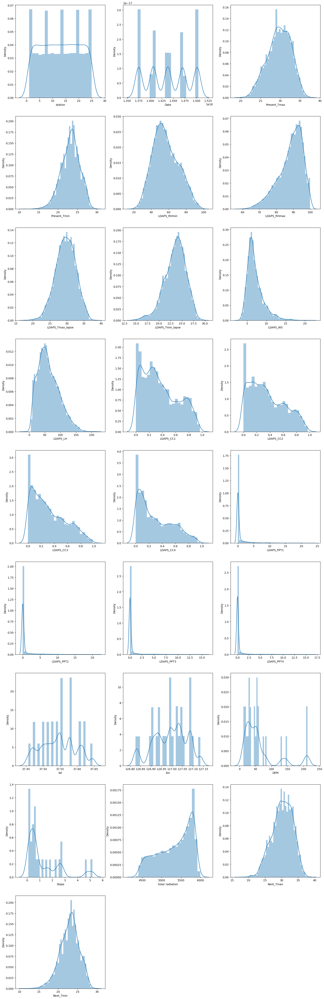

In [14]:
# Ploting Distribution plot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmin:
    
    if plotnumber <= 25:
        plt.subplot(9, 3, plotnumber)
        sns.distplot(df_tmin[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show()

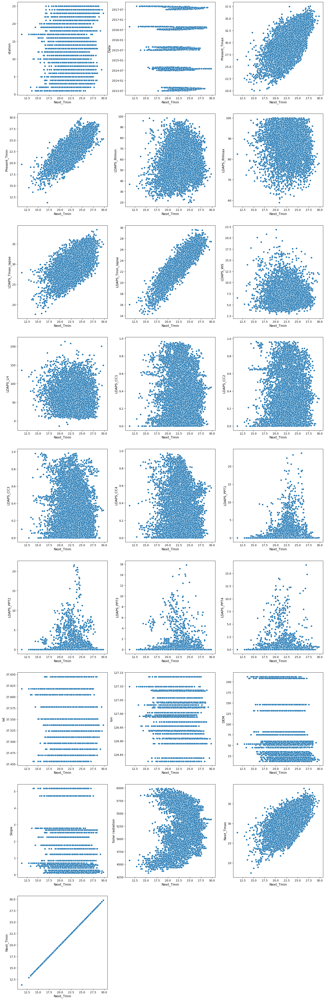

In [15]:
# Ploting Scatterplot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmin:
   
    if plotnumber <= 25:
        plt.subplot(9, 3, plotnumber)
        sns.scatterplot(x ='Next_Tmin', y =i, data =df_tmin)
        plt.xlabel('Next_Tmin', fontsize =12)
        plt.ylabel(i, fontsize =12)
    plotnumber+=1
plt.show()

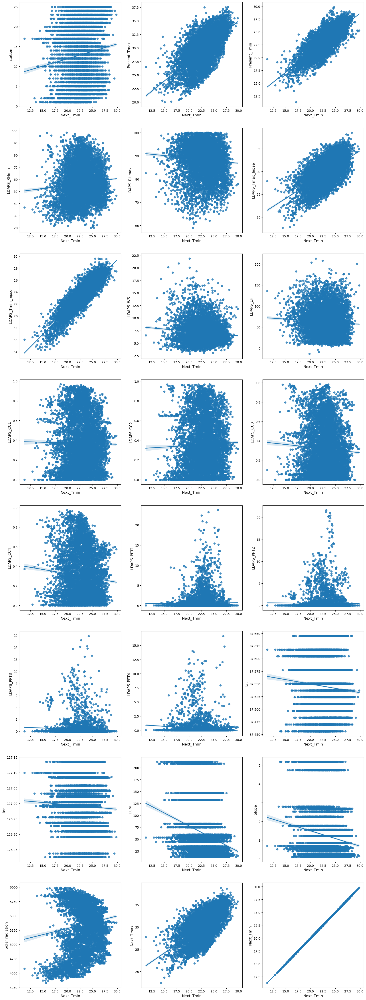

In [20]:
# Ploting LMPlot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmin:
    if i =='Date':
        continue
   
    if plotnumber <= 25:
        plt.subplot(9, 3, plotnumber)
        sns.regplot(x ='Next_Tmin', y =i, data =df_tmin)
        plt.xlabel('Next_Tmin', fontsize =12)
        plt.ylabel(i, fontsize =12)
    plotnumber+=1
plt.show()

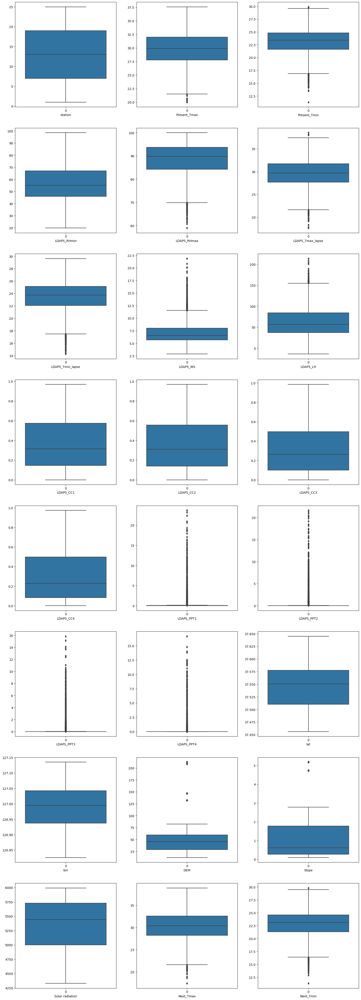

In [22]:
# Finding outliers using boxplot
plt.figure(figsize =(20, 65))
plotnumber =1

for i in df_tmin:
    if df_tmin[i].dtype =='datetime64[ns]':
        continue
    if plotnumber <=25:
        plt.subplot(9, 3, plotnumber)
        sns.boxplot(df_tmin[i])
        plt.xlabel(i)
    plotnumber+=1
plt.show()

In [24]:
# Removing outliers using zscore
df_score =df_tmin[['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
                  'LDAPS_LH', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Next_Tmax' ]]
z =np.abs(zscore(df_score))
z

,Present_Tmax,Present_Tmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Next_Tmax
0,1.431774,0.997954,0.291972,0.338506,0.541031,0.490845,1.175004,0.219530,0.275777,0.239969,0.224971,0.526719,0.688239
1,0.388121,0.793174,0.699626,0.424213,0.263837,0.811921,1.064268,0.305589,0.275777,0.204765,0.127140,0.155503,0.050930
2,1.229563,0.709866,1.069262,1.542876,0.338141,0.583325,0.567308,0.281882,1.010206,4.412129,0.553155,0.100761,1.555959
3,1.667686,0.373142,1.303306,0.628066,0.111877,0.861612,0.770096,0.101033,0.275777,0.231403,0.224971,0.315828,1.009617
4,0.724037,0.043400,1.143649,0.776001,0.416842,0.405240,0.549117,0.305589,0.275777,0.239969,0.224971,0.298272,0.238310
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7583,0.825142,1.331187,0.743310,0.521636,1.810002,0.390720,1.178664,0.305589,0.275777,0.239969,0.224971,0.569775,0.720377
7584,1.230665,1.792874,0.511498,1.222690,1.006934,0.344058,0.430803,11.991253,0.275777,0.239969,0.224971,0.611527,1.400717
7585,0.151107,0.001746,1.032250,0.540606,1.121009,2.160422,0.026298,0.305589,0.275777,0.239969,0.224971,2.769091,0.018792
7586,1.298068,0.668212,0.039810,0.968079,0.797218,0.853731,0.754894,0.266709,0.273499,0.239969,0.223695,0.100761,1.914922


In [26]:
df_tmin =df_tmin[(z < 4).all(axis =1)]
df_tmin.shape

(7111, 25)

__We have used z < 4 because data loss was more than 10% when used z <3.__

In [27]:
# Excluding date column to check skewness in the dataset
df_num =df_tmin.drop(columns =['Date'])

In [28]:
# Checking skewness
df_num.skew()

station            -0.002615
Present_Tmax       -0.301160
Present_Tmin       -0.352513
LDAPS_RHmin         0.319126
LDAPS_RHmax        -0.797065
LDAPS_Tmax_lapse   -0.197996
LDAPS_Tmin_lapse   -0.563594
LDAPS_WS            1.253973
LDAPS_LH            0.622913
LDAPS_CC1           0.544332
LDAPS_CC2           0.492905
LDAPS_CC3           0.692700
LDAPS_CC4           0.700249
LDAPS_PPT1          3.892928
LDAPS_PPT2          4.649661
LDAPS_PPT3          5.629491
LDAPS_PPT4          6.088083
lat                 0.090134
lon                -0.279877
DEM                 1.732452
Slope               1.573748
Solar radiation    -0.526234
Next_Tmax          -0.323143
Next_Tmin          -0.406919
dtype: float64

In [30]:
# Removing skewness from the dataset
df_tmin['LDAPS_WS'] =np.cbrt(df_tmin['LDAPS_WS'])
df_tmin['LDAPS_LH'] =np.cbrt(df_tmin['LDAPS_LH'])
df_tmin['LDAPS_CC3'] =np.cbrt(df_tmin['LDAPS_CC3'])
df_tmin['LDAPS_CC4'] =np.cbrt(df_tmin['LDAPS_CC4'])
df_tmin['LDAPS_PPT1'] =np.cbrt(df_tmin['LDAPS_PPT1'])
df_tmin['LDAPS_PPT2'] =np.cbrt(df_tmin['LDAPS_PPT2'])
df_tmin['LDAPS_PPT3'] =np.cbrt(df_tmin['LDAPS_PPT3'])
df_tmin['LDAPS_PPT4'] =np.cbrt(df_tmin['LDAPS_PPT4'])
df_tmin['DEM'] =np.cbrt(df_tmin['DEM'])
df_tmin['Slope'] =np.cbrt(df_tmin['Slope'])

In [32]:
# Again Checking Skewness
df_num =df_tmin.drop(columns =['Date'])
df_num.skew()

station            -0.002615
Present_Tmax       -0.301160
Present_Tmin       -0.352513
LDAPS_RHmin         0.319126
LDAPS_RHmax        -0.797065
LDAPS_Tmax_lapse   -0.197996
LDAPS_Tmin_lapse   -0.563594
LDAPS_WS            0.727835
LDAPS_LH           -0.246911
LDAPS_CC1           0.544332
LDAPS_CC2           0.492905
LDAPS_CC3          -0.547242
LDAPS_CC4          -0.428631
LDAPS_PPT1          1.869617
LDAPS_PPT2          2.305173
LDAPS_PPT3          2.462822
LDAPS_PPT4          2.779172
lat                 0.090134
lon                -0.279877
DEM                 0.923795
Slope               0.616518
Solar radiation    -0.526234
Next_Tmax          -0.323143
Next_Tmin          -0.406919
dtype: float64

In [33]:
# Again Removing skewness from the dataset

df_tmin['LDAPS_PPT1'] =np.cbrt(df_tmin['LDAPS_PPT1'])
df_tmin['LDAPS_PPT2'] =np.cbrt(df_tmin['LDAPS_PPT2'])
df_tmin['LDAPS_PPT3'] =np.cbrt(df_tmin['LDAPS_PPT3'])
df_tmin['LDAPS_PPT4'] =np.cbrt(df_tmin['LDAPS_PPT4'])
df_tmin['DEM'] =np.cbrt(df_tmin['DEM'])
df_tmin['Slope'] =np.cbrt(df_tmin['Slope'])

In [34]:
# Again Checking Skewness
df_num =df_tmin.drop(columns =['Date'])
df_num.skew()

station            -0.002615
Present_Tmax       -0.301160
Present_Tmin       -0.352513
LDAPS_RHmin         0.319126
LDAPS_RHmax        -0.797065
LDAPS_Tmax_lapse   -0.197996
LDAPS_Tmin_lapse   -0.563594
LDAPS_WS            0.727835
LDAPS_LH           -0.246911
LDAPS_CC1           0.544332
LDAPS_CC2           0.492905
LDAPS_CC3          -0.547242
LDAPS_CC4          -0.428631
LDAPS_PPT1          0.929248
LDAPS_PPT2          1.165899
LDAPS_PPT3          1.246941
LDAPS_PPT4          1.609293
lat                 0.090134
lon                -0.279877
DEM                 0.587160
Slope               0.252529
Solar radiation    -0.526234
Next_Tmax          -0.323143
Next_Tmin          -0.406919
dtype: float64

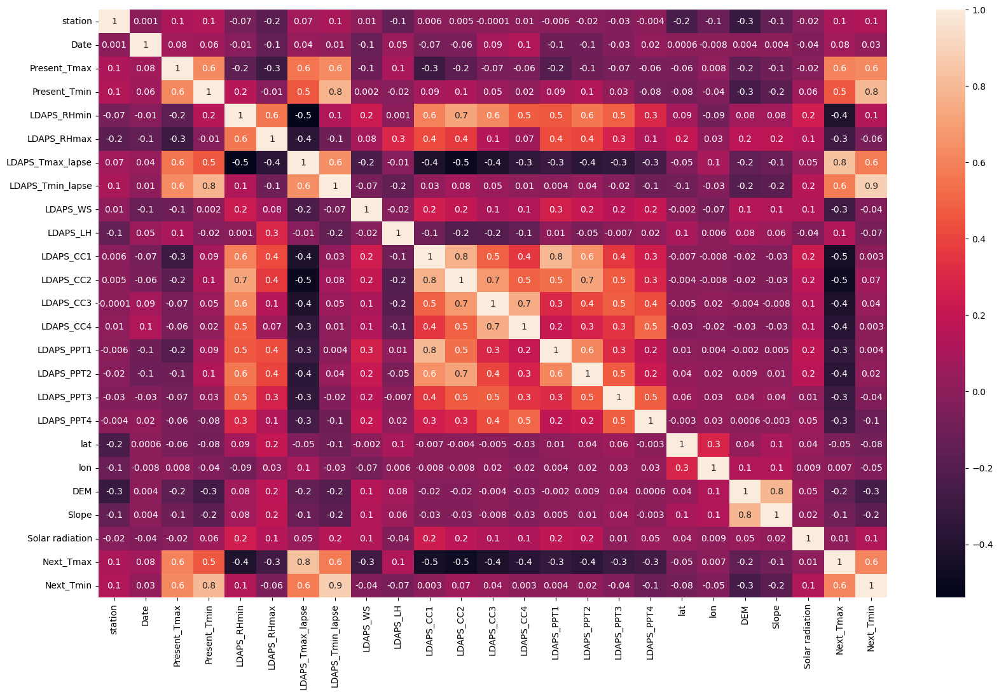

In [39]:
# Plotting heatmap
plt.figure(figsize =(20,12))
sns.heatmap(df_tmin.corr(), annot =True, fmt ='.1g')
plt.show()

__We found multicollinearity between (Next_Tmax and LDAPS_Tmax_lapse), (LDAPS_CC1 and LDAPS_PPT1),  (LDAPS_CC1 and LDAPS_CC2), (DEM and slope).__

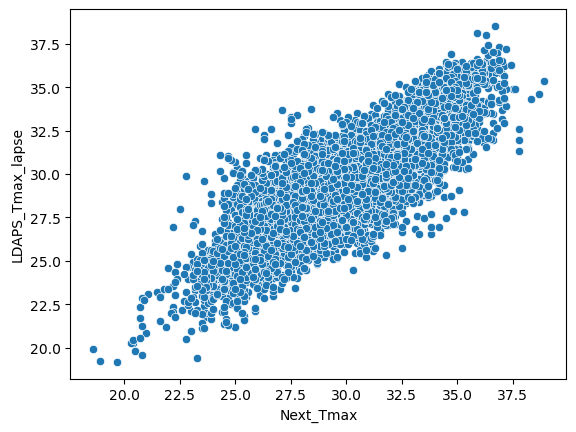

In [41]:
# Checking multicollinearity using scatterplot
sns.scatterplot(x ='Next_Tmax', y ='LDAPS_Tmax_lapse', data =df_tmin)
plt.show()

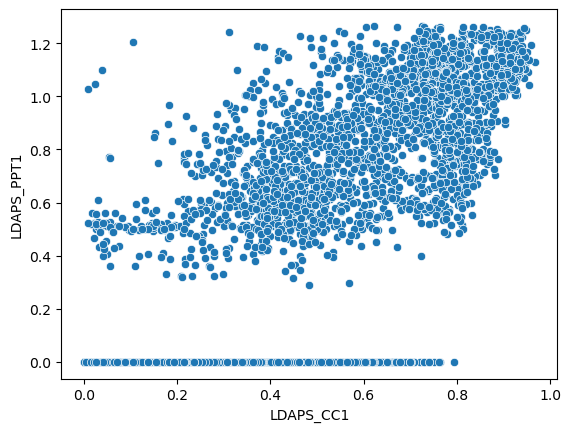

In [42]:
# Checking multicollinearity using scatterplot
sns.scatterplot(x ='LDAPS_CC1', y ='LDAPS_PPT1', data =df_tmin)
plt.show()

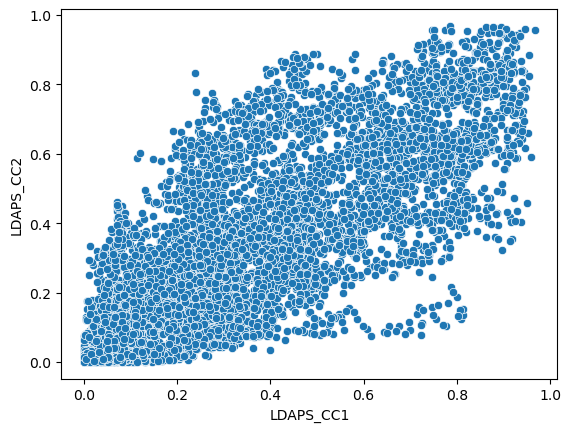

In [43]:
# Checking multicollinearity using scatterplot
sns.scatterplot(x ='LDAPS_CC1', y ='LDAPS_CC2', data =df_tmin)
plt.show()

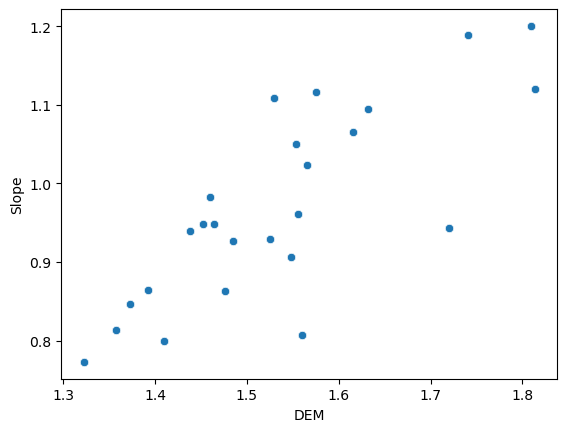

In [44]:
# Checking multicollinearity using scatterplot
sns.scatterplot(x ='DEM', y ='Slope', data =df_tmin)
plt.show()

__We found multicollinearity between (Next_Tmax and LDAPS_Tmax_lapse) and (LDAPS_CC1 and LDAPS_CC2).__

In [46]:
# Deleting LDAPS_Tmax_lapse and LDAPS_CC1
df_tmin.drop(columns =['LDAPS_Tmax_lapse', 'LDAPS_CC1'], inplace =True)

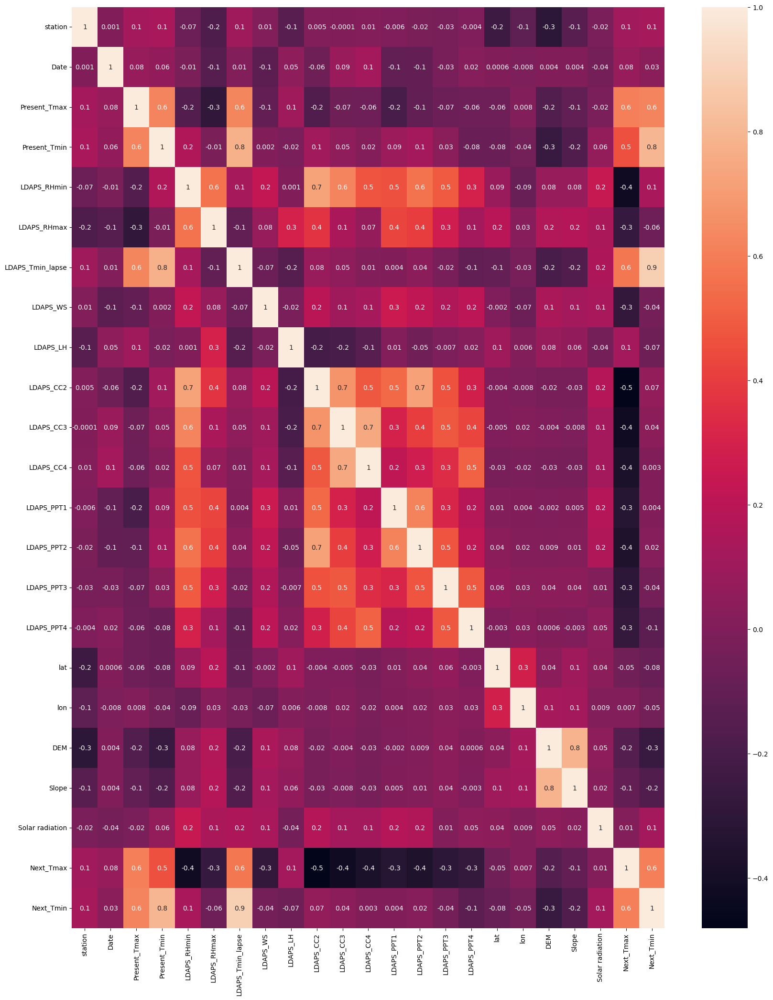

In [47]:
# Again Plotting heatmap
plt.figure(figsize =(20,25))
sns.heatmap(df_tmin.corr(), annot =True, fmt ='.1g')
plt.show()

In [48]:
#Deleting data column as it will not have any impact on label prediction
df_tmin.drop(columns =['Date'], inplace =True)

In [49]:
# Seperating Features and label
x =df_tmin.drop(columns =['Next_Tmin'])
y =df_tmin[['Next_Tmin']]

In [50]:
# Data Standardization
scaler =StandardScaler()
x =pd.DataFrame(scaler.fit_transform(x), columns =x.columns)
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC2,LDAPS_CC3,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,-1.389948,-1.474577,-1.003856,0.437628,-0.244687,-0.558463,-0.431521,-1.293813,-0.453686,0.223038,...,1.234337,-0.625121,-0.599856,-0.512996,0.659310,0.844837,-0.446668,-0.871011,-0.866303,-0.754664
1,0.551202,0.359879,0.789654,0.074770,0.743281,0.246399,-0.859732,1.042596,0.262771,0.877697,...,-0.694369,-0.625121,1.337042,1.832277,1.466011,1.360909,0.166310,-0.063629,0.315341,0.003644
2,-1.528601,-1.712376,-0.378213,1.587087,1.344751,-0.129312,1.076593,-0.664231,0.058981,0.153555,...,1.429097,-0.625121,1.055537,-0.512996,1.197111,0.517572,-0.067677,-0.328231,1.099832,-1.084363
3,-1.251294,-0.761177,0.038882,-0.078489,1.185679,-0.434275,-0.322998,0.661989,-0.925628,-1.298798,...,-0.694369,-0.625121,-0.599856,-0.512996,2.001819,0.391700,-0.040173,1.163795,-1.992650,-0.293085
4,-0.835334,-0.523377,0.038882,-0.997943,-0.219501,-0.823977,-1.153930,1.564055,-0.822535,-2.561167,...,-0.694369,-0.625121,-0.599856,-0.512996,0.659310,-1.924332,-1.629526,-1.618491,1.095386,0.597103
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7106,-0.003412,-0.013806,0.414268,0.029917,0.453472,0.431929,-1.154921,-0.816670,0.741196,0.276930,...,0.990329,-0.625121,-0.599856,-0.512996,0.659310,1.159515,0.316660,1.223304,0.695743,-0.194175
7107,0.135241,-0.863091,-1.337532,-0.385661,0.786805,-1.827424,-0.304807,-1.300529,-1.116840,-1.540352,...,-0.694369,-0.625121,-0.599856,-0.512996,-0.952100,-0.804077,-0.538118,-0.169280,-0.451248,-0.787634
7108,-1.667255,-0.183663,-0.002827,0.652618,1.074687,1.103563,2.237862,0.215168,-0.047101,-0.396980,...,-0.694369,-0.625121,-0.599856,-0.512996,1.197111,0.001499,2.147261,1.260363,0.112771,-0.029326
7109,0.689856,1.277107,0.664525,-0.312331,0.085881,0.779776,-0.918200,0.819987,-0.234490,0.047811,...,1.071366,0.742681,-0.599856,0.935167,-1.221000,0.416875,0.238466,0.455723,0.228754,1.915899


In [51]:
# Checking variance inflation factor
vif =pd.DataFrame()
vif['Scores'] =[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] =x.columns
vif

,Scores,Features
0,1.259762,station
1,2.598291,Present_Tmax
2,3.168636,Present_Tmin
3,3.978665,LDAPS_RHmin
4,2.269581,LDAPS_RHmax
5,4.203728,LDAPS_Tmin_lapse
6,1.272959,LDAPS_WS
7,1.510198,LDAPS_LH
8,4.267216,LDAPS_CC2
9,3.817187,LDAPS_CC3


__VIF score of all the columns are less than 5. So we will not delete any columns.__

# EDA Completed

## Model Building

### Finding Best random state

In [52]:
maxrs =0
maxacc =0

for i in range(1, 200):
    x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =i)
    LR =LinearRegression()
    LR.fit(x_train, y_train)
    pred =LR.predict(x_test)
    acc =r2_score(y_test, pred)
    
    if acc > maxacc:
        maxacc =acc
        maxrs =1
        
print("Maximum accuracy is :", maxacc, "at random state :", maxrs)

Maximum accuracy is : 0.8604179724884671 at random state : 1


In [53]:
x_train, x_test, y_train, y_test =train_test_split(x, y, test_size =0.3, random_state =maxrs)

In [54]:
# Initializing models
RFR =RandomForestRegressor()
ETR =ExtraTreesRegressor()
LR =LinearRegression()
svr =SVR()
GBR =GradientBoostingRegressor()
ADR =AdaBoostRegressor()
BR =BaggingRegressor()
DTR =DecisionTreeRegressor()
lasso =Lasso()
ridge =Ridge()
knn =KNeighborsRegressor()

In [55]:
# Defining Models
models ={'RandomForestRegressor' :RFR,
        'ExtraTreesRegressor' :ETR,
        'LinearRegression' :LR,
        'SVR': svr,
        'GradientBoostingRegressor': GBR,
        'AdaBoostRegressor' :ADR,
        'BaggingRegressor' :BR,
        'DecisionTreeRegressor' :DTR,
        'Lasso' :lasso,
        'Ridge': ridge,
        'KNeighborsRegressor' :knn}

for name, model in models.items():
    model.fit(x_train, y_train)
    pred_test =model.predict(x_test)
    pred_train =model.predict(x_train)
    acc =r2_score(y_test, pred_test)
    
    print("Model Name :", name)
    print('*'*20)
    print("Accuracy of model on training data :", (r2_score(y_train, pred_train))*100)
    print("Accuracy of model on test data :", (r2_score(y_test, pred_test))*100)
    print("Mean Squared Error :", mean_squared_error(y_test, pred))
    print("Mean Absolute Error :", mean_absolute_error(y_test, pred))
    print("Root Mean Squared Error :", np.sqrt(mean_squared_error(y_test, pred)))
    
    print('\n')
    print("Cross Validation")
    print("*"*20)
    score =cross_val_score(model, x, y, cv=5)
    print(score)
    print(score.mean())
    print("Difference between R2 Score and cross validation is :",(acc - (score.mean()))*100)
    print('='*80)
    print('\n')

Model Name : RandomForestRegressor
********************
Accuracy of model on training data : 98.67600433853954
Accuracy of model on test data : 90.11893816069991
Mean Squared Error : 11.077309847815961
Mean Absolute Error : 2.6235744103960195
Root Mean Squared Error : 3.3282592819394288


Cross Validation
********************
[0.91525875 0.90484379 0.89918437 0.91392567 0.91639547]
0.9099216109323607
Difference between R2 Score and cross validation is : -0.8732229325361551


Model Name : ExtraTreesRegressor
********************
Accuracy of model on training data : 100.0
Accuracy of model on test data : 91.26617044480892
Mean Squared Error : 11.077309847815961
Mean Absolute Error : 2.6235744103960195
Root Mean Squared Error : 3.3282592819394288


Cross Validation
********************
[0.92315087 0.9124313  0.90949072 0.92422366 0.9222614 ]
0.9183115912411349
Difference between R2 Score and cross validation is : -0.5649886793045678


Model Name : LinearRegression
********************
Acc

__ExtraTreesRegressor is our best model, with the accuracy of 91.26%.__

# Hyperparameter Tunning

In [56]:
parameter ={'n_estimators' :[10, 20, 50, 100],
           'criterion': ['squared_error', 'friedman_mse', 'absolute_error'],
           'max_depth': [2, 8, 16],
           'min_samples_split' :[2, 4, 6],
           'min_samples_leaf' :[1, 2],
           'max_features' :['sqrt', 'log2']
           }

In [57]:
GCV =GridSearchCV(ExtraTreesRegressor(), parameter, cv=5)
GCV.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=ExtraTreesRegressor(),
             param_grid={'criterion': ['squared_error', 'friedman_mse',
                                       'absolute_error'],
                         'max_depth': [2, 8, 16],
                         'max_features': ['sqrt', 'log2'],
                         'min_samples_leaf': [1, 2],
                         'min_samples_split': [2, 4, 6],
                         'n_estimators': [10, 20, 50, 100]})

In [58]:
GCV.best_params_

{'criterion': 'squared_error',
 'max_depth': 16,
 'max_features': 'sqrt',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [69]:
ETR =ExtraTreesRegressor(criterion ='squared_error',
                        max_depth =128,
                        max_features ='sqrt',
                        min_samples_leaf =1,
                        min_samples_split =2,
                        n_estimators =100)
ETR.fit(x_train, y_train)
pred =ETR.predict(x_test)
acc =r2_score(y_test, pred)
print("Accuracy after hyperparamter tunning is :", acc*100)

Accuracy after hyperparamter tunning is : 90.86182794259528


__Accuracy does not increase after hyperparameter tunning. We will go with default parameters.__

In [71]:
Final_model =ExtraTreesRegressor()
Final_model.fit(x_train, y_train)
pred =Final_model.predict(x_test)
acc =r2_score(y_test, pred)
print("Accuracy of the model is :", acc*100)

Accuracy of the model is : 91.23644438273763


In [72]:
# Saving model
pickle.dump(Final_model, open('Temp_Forecast_Min.pkl', 'wb'))

In [73]:
# Loading the model
loaded_model =pickle.load(open('Temp_Forecast_Min.pkl', 'rb'))
pred =loaded_model.predict(x_test)
acc =loaded_model.score(x_test, y_test)
print("Accucary is :", acc*100)

Accucary is : 91.23644438273763


In [74]:
# Comparing Actual Vs Predicted
act =np.array(y_test)
df1 =pd.DataFrame()
df1['Predicted'] =pred
df1['Actual'] =act
df1

,Predicted,Actual
0,21.683,21.5
1,26.015,26.8
2,21.279,21.2
3,21.435,22.6
4,18.304,17.7
...,...,...
2129,24.745,24.0
2130,24.668,24.8
2131,20.761,21.5
2132,25.038,24.6
